In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import robotdatapy as rdp # 1.0.3

# scipy rotation matrix
import scipy as sp

In [4]:
# plt.style.use('/home/masonbp/computer/python/matplotlib/publication.mplstyle')
SAVE = False
QUICK = True
ADD_ANNOTATIONS = True

# quicker
if QUICK:
    num_pcs = 100
    num_markers = 500
else:
    num_pcs = 1000
    num_markers = 3000


In [5]:
def get_pc(bag_path, topic):
    pcd = rdp.data.PointCloudData.from_bag(
        path=bag_path,
        topic=topic,
    )

    marker_data = rdp.data.GeneralData.from_bag(
        path=bag_path,
        topic="/RR01/actual_traj",
        ros_distro='humble',
        time_tol=5.0,
        causal=False
    )

    pc = pcd.pointcloud(pcd.t0).get_xyz()
    pc_frame = pcd.msg_header(pcd.t0).frame_id
    print("pc_frame:", pc_frame)

    try:
        pd = rdp.data.PoseData.from_bag_tf(bag_path,
                                    parent_frame="map", child_frame=pc_frame,
                                    time_tol=5.0)
    except:
        pd = rdp.data.PoseData.from_bag_tf(bag_path,
                                    parent_frame="map", child_frame=f"/{pc_frame}",
                                    time_tol=5.0)

    pc = rdp.transform.transform(pd.pose(pcd.tf), pcd.pointcloud(pcd.tf).get_xyz())
    return pc, pcd, pd, marker_data

def get_marker_data(bag_path):

    marker_data = rdp.data.GeneralData.from_bag(
        path=bag_path,
        topic="/RR01/actual_traj",
        ros_distro='humble',
        time_tol=5.0,
        causal=False
    )
    return marker_data

def get_pos_from_tf(bag_path):

    marker_data = rdp.data.PoseData.from_bag_tf(bag_path,
                                    parent_frame="map", 
                                    child_frame="/RR01/base_link",
                                    time_tol=5.0)
    return marker_data

def apply_transform(points):
    T_side_view = rdp.transform.xyz_rpy_to_transform([0., 0., 0.], [-80., -0., 0.], degrees=True) @ \
        rdp.transform.xyz_rpy_to_transform([0., 0., 0.,], [0., 0., -30.], degrees=True)
    # T_side_view = np.eye(4)

    # degrees to rotation matrix
    roll = 180
    pitch = 0
    yaw = 0

    rotation_matrix = sp.spatial.transform.Rotation.from_euler('xyz', [roll, pitch, yaw], degrees=True).as_matrix()
    T_world_cam = np.array([
        [1., 0., 0., 60.,],
        [0., -1., 0., 0.,],
        [0., 0., -1., 175.,],
        [0., 0., 0., 1.,]
    ])

    K = np.array([[300, 0., 0.], [0., 300, 0.], [0., 0., 1.]])

    points_cam = rdp.transform.transform(np.linalg.inv(T_world_cam) @ T_side_view, points)
    points_cam = points_cam[points_cam[:,2] > 0.1]
    points_side_view = rdp.camera.xyz_2_pixel(points_cam, K)
    return points_side_view

In [29]:
def plot_pc(pc, pcd, pd, marker_data, bag_path, figure_name, plot_path=True):
    plt.style.use('dark_background')
    t = np.linspace(pcd.t0, pcd.tf, num_pcs)

    pcs = []
    for ti in t:
        try:
            pc = pcd.pointcloud(ti).get_xyz()
        except:
            continue
        if len(pcd.pointcloud(ti).get_xyz()) == 0:
            continue
        pc = rdp.transform.transform(pd.pose(ti), pcd.pointcloud(ti).get_xyz())
        pcs.append(pc)
        # ax.plot(pc[:,0], pc[:,1], '.', markersize=0.1, alpha=0.2, color='xkcd:aqua')

    pc = np.vstack(pcs)

    marker_xyz = []
    marker_colors = []
    if plot_path:
        for ti in np.linspace(marker_data.t0, marker_data.tf, num_markers):
            position_ros = marker_data.data(ti).points[0]
            color_ros = marker_data.data(ti).color
            mi = np.array([position_ros.x, position_ros.y, position_ros.z])
            marker_xyz.append(mi)
            marker_colors.append([color_ros.r, color_ros.g, color_ros.b])
        marker_xyz = np.array(marker_xyz)
        marker_colors = np.array(marker_colors)

    # Create figure and axis
    fig, ax = plt.subplots(figsize=(10,10), dpi=500)

    # Plot marker data with its corresponding colors
    if plot_path:
        for i in range(marker_xyz.shape[0]):
            ax.plot(marker_xyz[i,0], marker_xyz[i,1], '.', markersize=5.0, alpha=1.0, color=marker_colors[i])

    # Plot the aggregated point cloud in a light color
    ax.plot(pc[:,0], pc[:,1], '.', markersize=0.15, alpha=0.1, color='xkcd:white')

    # --- Compute and add an accurate 10 m scale bar ---
    # Compute the bounding box of the point cloud data (assumed to be in meters)
    x_min, x_max = np.min(pc[:,0]), np.max(pc[:,0])
    y_min, y_max = np.min(pc[:,1]), np.max(pc[:,1])

    # Define a padding (5% of axis range) so the scale bar is not flush with the plot edge
    x_pad = 0.05 * (x_max - x_min)
    y_pad = 0.05 * (y_max - y_min)

    # Set the start and end positions for the scale bar in data coordinates
    x_scale_start = x_min + x_pad
    # x_scale_start = marker_xyz[0,0]
    x_scale_end = x_scale_start + 10.0  # 10 meters
    y_scale = y_max - y_pad

    # Draw the horizontal scale bar
    ax.plot([x_scale_start, x_scale_end], [y_scale, y_scale], color='white', linewidth=1.5)
    # Draw vertical ticks at the scale bar endpoints
    ax.plot([x_scale_start, x_scale_start], [y_scale - 0.5, y_scale + 0.5], color='white', linewidth=0.5)
    ax.plot([x_scale_end, x_scale_end], [y_scale - 0.5, y_scale + 0.5], color='white', linewidth=0.5)
    # Label the scale bar
    ax.text(x_scale_start, y_scale - 4.5, '10 m', color='white', fontsize=16)

    # Set equal aspect ratio and turn off axis
    ax.set_aspect('equal')
    ax.axis('off')

    # --- Optional annotations ---
    if ADD_ANNOTATIONS:
        markersize = 10.0
        bbox_props = dict(facecolor='white', boxstyle='round,pad=0.1')
        bbox = bbox=dict(facecolor='white', boxstyle='round,pad=0.1')
        # Plot start and goal markers
        # ax.plot([marker_xyz[0,0]], [marker_xyz[0,1]], '.', markersize=markersize, alpha=1.0, color='xkcd:red')
        # ax.plot([marker_xyz[-1,0]], [marker_xyz[-1,1]], '.', markersize=markersize, alpha=1.0, color='xkcd:blue')
        # Label start and goal
        # ax.text(marker_xyz[0,0] - 13.0, marker_xyz[0,1] - 1, 'Start', color='red', fontsize=16, bbox=bbox_props)
        # ax.text(marker_xyz[-1,0] - 15.0, marker_xyz[-1,1] + 6, 'Person Detected', color='blue', fontsize=16, bbox=bbox_props)
        # Add vertical climb annotation
        # rect = patches.Rectangle([95, -65], 10, 10, edgecolor='xkcd:bright green', 
        #                      facecolor='none', linewidth=2.5, linestyle='--', zorder=2)
        # ax.text(88, -70, 'Vertical Climb', color='xkcd:green', fontsize=16, bbox=bbox)
        # ax.add_patch(rect)

    # Save the figure if required
    if SAVE:
        # folder path is one level up from the bag path
        folder_path = bag_path[:bag_path.rfind('/')]
        plt.savefig(folder_path + figure_name, bbox_inches='tight')

    return ax, pc, marker_xyz, marker_colors

def plot_with_angle(pc, marker_xyz, marker_colors, bag_path, figure_name):

    pc_side_view = apply_transform(pc)
    marker_xyz_side_view = apply_transform(marker_xyz)

    fig, ax = plt.subplots(figsize=(10,10), dpi=500)
    for i in range(0, marker_xyz_side_view.shape[0]):
        ax.plot(marker_xyz_side_view[i,0], -marker_xyz_side_view[i,1], '.', markersize=5.0, alpha=1.0, color=marker_colors[i])
    ax.plot(pc_side_view[:,0], -pc_side_view[:,1], '.', markersize=0.15, alpha=0.1, color='xkcd:white')
    ax.set_aspect('equal')
    ax.axis('off')

    if ADD_ANNOTATIONS:
        markersize = 20.0
        bbox = bbox=dict(facecolor='white', boxstyle='round,pad=0.1')
        ax.plot([marker_xyz_side_view[0,0]], [-marker_xyz_side_view[0,1]], '.', markersize=markersize, alpha=1.0, color='xkcd:red')
        ax.plot([marker_xyz_side_view[-1,0]], [-marker_xyz_side_view[-1,1]], '.', markersize=markersize, alpha=1.0, color='xkcd:blue')
        ax.text(marker_xyz_side_view[0,0] - 6, -marker_xyz_side_view[0,1] - 12, 'Start', color='red', fontsize=16, bbox=bbox)
        ax.text(marker_xyz_side_view[-1,0] - 8, -marker_xyz_side_view[-1,1] + 10, 'Person Detected', color='blue', fontsize=16, bbox=bbox)
        # rect = patches.Rectangle([-32, -95], 35, 45, edgecolor='xkcd:bright green', 
        #                      facecolor='none', linewidth=2.5, linestyle='--', zorder=2)
        # ax.text(-20, -45, 'Vertical Climb', color='xkcd:green', fontsize=16, bbox=bbox)
        # ax.text(10, -75, 'Vertical Climb', color='xkcd:green', fontsize=16, bbox=bbox)
        # ax.add_patch(rect)
        
    if SAVE:
        # folder path is one level up from the bag path
        folder_path = bag_path[:bag_path.rfind('/')]
        plt.savefig(folder_path + figure_name, bbox_inches='tight')

In [21]:
def get_color_jet(v, vmin, vmax):
    """
    Returns a tuple (r, g, b, a) corresponding to the color
    based on the jet color mapping for value v in range [vmin, vmax].
    """
    # Default white with full opacity
    r, g, b, a = 1.0, 1.0, 1.0, 1.0

    # Clamp v to [vmin, vmax]
    if v < vmin:
        v = vmin
    if v > vmax:
        v = vmax

    dv = vmax - vmin

    if v < (vmin + 0.25 * dv):
        r = 0.0
        g = 4 * (v - vmin) / dv
        # b remains 1.0
    elif v < (vmin + 0.5 * dv):
        r = 0.0
        b = 1 + 4 * (vmin + 0.25 * dv - v) / dv
    elif v < (vmin + 0.75 * dv):
        r = 4 * (v - vmin - 0.5 * dv) / dv
        b = 0.0
    else:
        g = 1 + 4 * (vmin + 0.75 * dv - v) / dv
        b = 0.0

    # convert them in float
    r = float(r)
    g = float(g)
    b = float(b)

    # clip to make sure they are in the range [0, 1]
    r = max(0.0, min(r, 1.0))
    g = max(0.0, min(g, 1.0))
    b = max(0.0, min(b, 1.0))

    return np.array([r, g, b])

In [22]:

import numpy as np
import rosbag2_py
import rclpy
from rclpy.serialization import deserialize_message
from rosidl_runtime_py.utilities import get_message
from dynus_interfaces.msg import Goal

def read_ros2_bag(bag_path, topic_name, message_type):
    """
    Reads a ROS 2 bag file and extracts messages from a specified topic.

    Args:
        bag_path (str): Path to the ROS 2 bag file.
        topic_name (str): The name of the topic to extract data from.
        message_type (str): The message type as a string (e.g., "geometry_msgs/msg/Twist").

    Returns:
        list: A list of messages from the specified topic.
    """
    storage_options = rosbag2_py.StorageOptions(uri=bag_path, storage_id="sqlite3")
    converter_options = rosbag2_py.ConverterOptions(
        input_serialization_format="cdr", output_serialization_format="cdr"
    )

    reader = rosbag2_py.SequentialReader()
    reader.open(storage_options, converter_options)

    all_topics = reader.get_all_topics_and_types()
    topic_names = [topic.name for topic in all_topics]

    topic_found = any(t == topic_name for t in topic_names)
    if not topic_found:
        print(f"Topic '{topic_name}' not found in the bag.")
        return []

    # Resolve the message type dynamically
    msg_type = get_message(message_type)

    data = []
    while reader.has_next():
        topic, serialized_msg, _ = reader.read_next()
        if topic == topic_name:
            msg = deserialize_message(serialized_msg, msg_type)
            data.append(msg)

    return data

def process_goal_data(messages):
    """
    Processes goal data to extract desired values and computes averages.

    Args:
        messages (list): List of ROS 2 messages.

    Returns:
        np.ndarray: Array of extracted values.
    """
    
    # Get the very first msg's time stamp
    # start_time = messages[0].header.stamp.sec + messages[0].header.stamp.nanosec * 1e-9

    # Extract goal positions
    positions = [[msg.p.x, msg.p.y, msg.p.z] for msg in messages]

    # Extract velocities
    velocities = [np.linalg.norm(np.array([msg.v.x, msg.v.y, msg.v.z])) for msg in messages]

    # Extract accelerations
    accelerations = [np.linalg.norm(np.array([msg.a.x, msg.a.y, msg.a.z])) for msg in messages]

    # Extract jerk
    jerks = [np.linalg.norm(np.array([msg.j.x, msg.j.y, msg.j.z])) for msg in messages]

    # start time and end time
    start_time = messages[0].header.stamp.sec + messages[0].header.stamp.nanosec * 1e-9
    end_time = messages[-1].header.stamp.sec + messages[-1].header.stamp.nanosec * 1e-9

    return np.array(positions), np.array(velocities), np.array(accelerations), np.array(jerks), start_time, end_time

In [23]:
def plot_path(ax, marker_data, bag_path, figure_name):

    marker_xyz = []
    marker_colors = []

    if isinstance(marker_data, rdp.data.PoseData):

        # Define the minimum and maximum speeds for your color mapping.
        # You may adjust these values based on your data.
        vmin = 0.0
        vmax = 0.7

        for ti in np.linspace(marker_data.t0, marker_data.tf, num_markers):
            current_pos = marker_data.position(ti)
            marker_xyz.append(current_pos)
            # Get the color based on the current speed.
            # color = get_color_jet(speed, vmin, vmax)
            color = [1.0, 1.0, 1.0]
            marker_colors.append(color)

    else:

        for ti in np.linspace(marker_data.t0, marker_data.tf, num_markers):
            position_ros = marker_data.data(ti).pose.position
            color_ros = marker_data.data(ti).color
            mi = np.array([position_ros.x, position_ros.y, position_ros.z])
            print("marker_data.data().tf:", marker_data.data(marker_data.tf))
            marker_xyz.append(rdp.transform.transform(pd.pose(ti), mi))
            marker_colors.append([color_ros.r, color_ros.g, color_ros.b])


    marker_xyz = np.array(marker_xyz)
    marker_colors = np.array(marker_colors)

    # Create figure and axis
    # fig, ax = plt.subplots(figsize=(10,10), dpi=500)

    # Plot marker data with its corresponding colors
    for i in range(marker_xyz.shape[0]):
        ax.plot(marker_xyz[i,0], marker_xyz[i,1], '.', markersize=5.0, alpha=1.0, color=marker_colors[i])

    # Set equal aspect ratio and turn off axis
    ax.set_aspect('equal')
    ax.axis('off')

    # --- Optional annotations ---
    if ADD_ANNOTATIONS:
        markersize = 10.0
        bbox_props = dict(facecolor='white', boxstyle='round,pad=0.1')
        # Plot start and goal markers
        ax.plot([marker_xyz[0,0]], [marker_xyz[0,1]], '.', markersize=markersize, alpha=1.0, color='xkcd:red')
        ax.plot([marker_xyz[-1,0]], [marker_xyz[-1,1]], '.', markersize=markersize, alpha=1.0, color='xkcd:blue')
        # Label start and goal
        ax.text(marker_xyz[0,0] - 13.0, marker_xyz[0,1] - 1, 'Start', color='red', fontsize=16, bbox=bbox_props)
        ax.text(marker_xyz[-1,0] - 15.0, marker_xyz[-1,1] + 6, 'Person Detected', color='blue', fontsize=16, bbox=bbox_props)
        # Add vertical climb annotation
        # rect = patches.Rectangle([95, -65], 10, 10, edgecolor='xkcd:bright green', 
        #                      facecolor='none', linewidth=2.5, linestyle='--', zorder=2)
        # ax.text(88, -70, 'Vertical Climb', color='xkcd:green', fontsize=16, bbox=bbox)
        # ax.add_patch(rect)

    # Save the figure if required
    if SAVE:
        # folder path is one level up from the bag path
        folder_path = bag_path[:bag_path.rfind('/')]
        plt.savefig(folder_path + figure_name, bbox_inches='tight')

    return marker_xyz, marker_colors

pc_frame: RR01/base_link


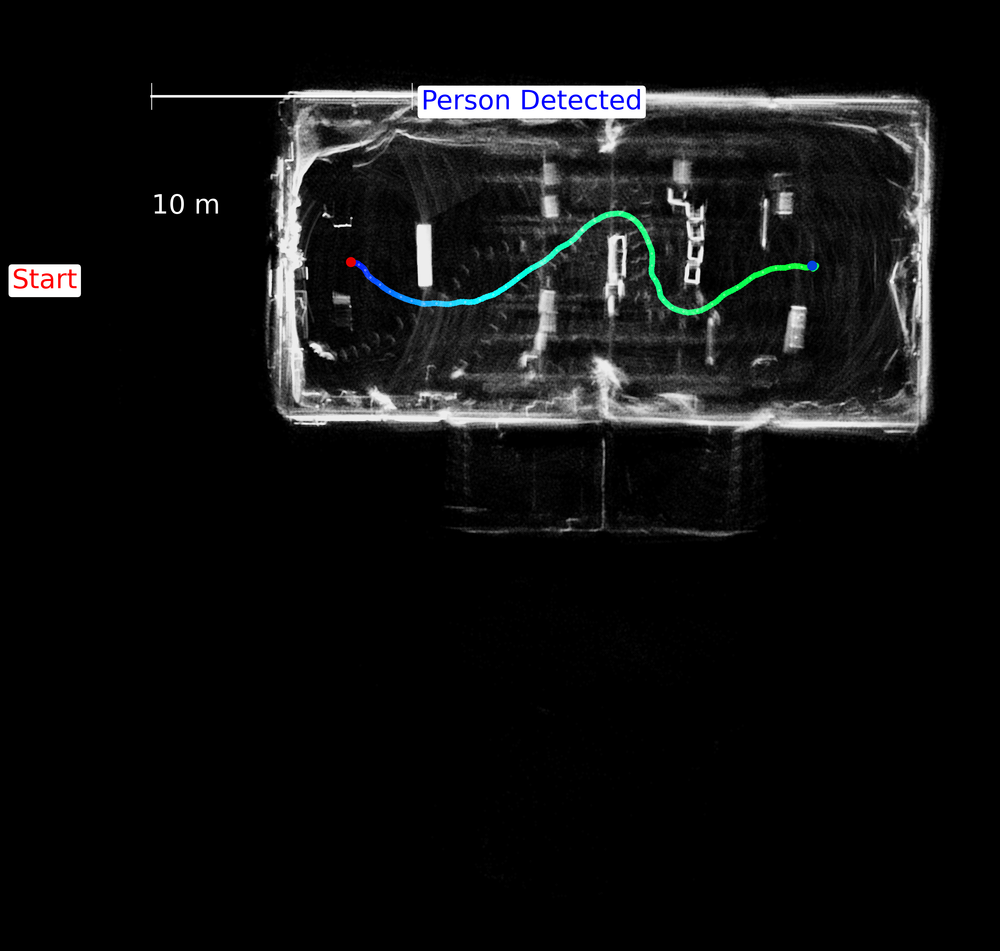

In [19]:
# Get DGP's data 
# topic_name = "/RR01/goal"
# message_type = "dynus_interfaces/msg/Goal"  # Update with your message type

# # Initialize arrays to store data
# goal_pos_array = np.array([])
# goal_vel_array = np.array([])

# # Read the bag and extract data
# messages = read_ros2_bag(bag_path, topic_name, message_type)

# # Process data
# pos, vel, accel, jerk, start_time, end_time = process_goal_data(messages)

# # Append to the arrays
# goal_pos_array = pos
# dgp_vel_array = vel

# plot the point cloud data
bag_path = "/media/kkondo/T7/dynus/tro_paper/hardware/quadruped/test2"
topic = "/RR01/livox/lidar"
pc, pcd, pd, marker_data = get_pc(bag_path, topic)
ax, pc, marker_xyz, marker_colors = plot_pc(pc, pcd, pd, marker_data, bag_path, "/ground_robot_overhead_pc.png")

# plot_with_angle(pc, marker_xyz, marker_colors, bag_path, "/ground_robot_side_view_pc.png")

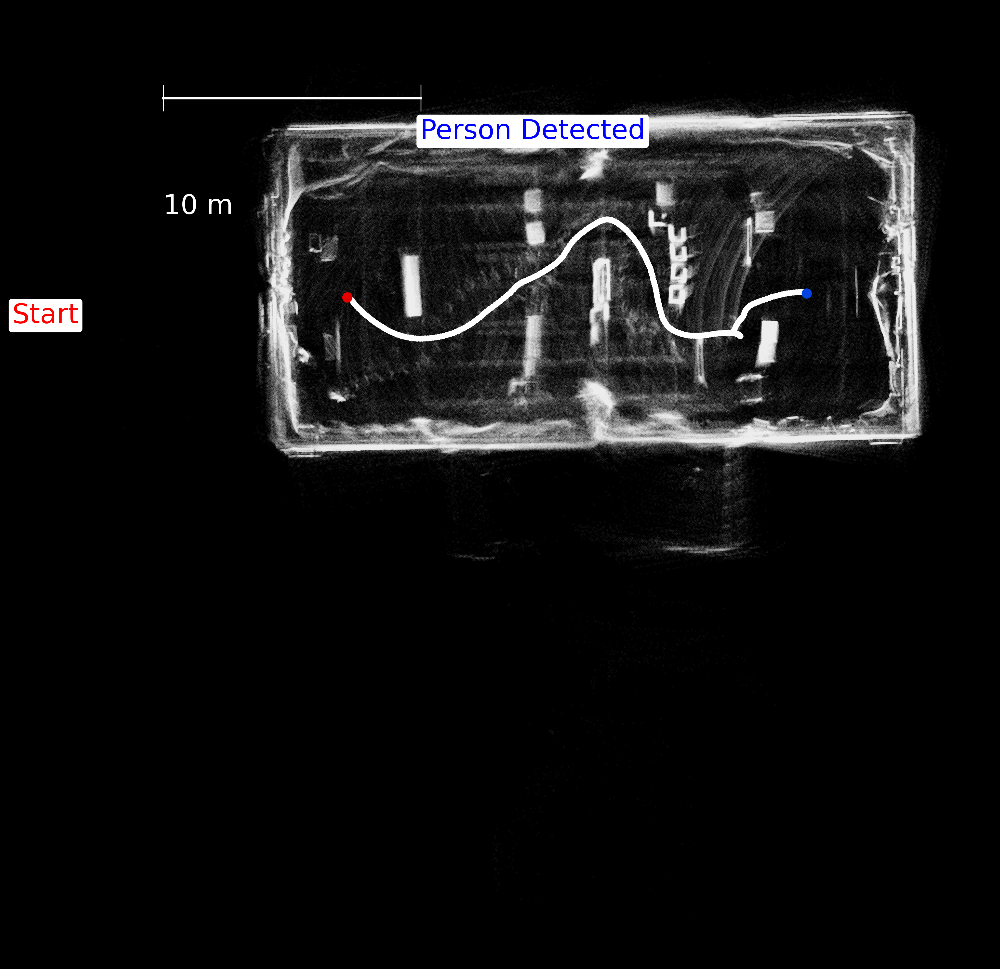

In [30]:
# plot the point cloud data
bag_path = "/media/kkondo/T7/dynus/tro_paper/hardware/red_rover/old/test1_without_goal"
topic = "/RR01/livox/lidar"
# pc, pcd, pd, marker_data = get_pc(bag_path, topic)
ax, pc, marker_xyz, marker_colors = plot_pc(pc, pcd, pd, marker_data, bag_path, "/ground_robot_overhead_pc.png", False)
marker_data = get_pos_from_tf(bag_path)
marker_xyz, marker_colors = plot_path(ax, marker_data, bag_path, "/ground_robot_overhead_pc.png")